In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
import scipy.sparse as sp
import yaml
import gc

import rmm
import cupy as cp
from rmm.allocators.cupy import rmm_cupy_allocator

import psutil
import torch
from datetime import datetime

import anndata as an
import scanpy as sc
import rapids_singlecell as rsc
import scvi

sc.settings.verbosity = 3

/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_categorical_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_continuous_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)


# Memory Management

In [2]:
# Enable `managed_memory`
rmm.reinitialize(
    managed_memory=True,
    pool_allocator=False,
)
cp.cuda.set_allocator(rmm_cupy_allocator)

In [3]:
def print_memory_usage():
    now = datetime.now().strftime('%Y-%m-%d %H:%M:%S')
    print(f"[{now}] Memory Report:")
    
    # RAM usage
    ram = psutil.virtual_memory()
    ram_used_gb = ram.used / 1e9
    print(f"  • RAM used:     {ram_used_gb:.2f} GB")

    # GPU usage
    if torch.cuda.is_available():
        gpu_mem = torch.cuda.memory_allocated() / 1e9
        print(f"  • GPU RAM used: {gpu_mem:.2f} GB")
    else:
        print("  • GPU not available or not using PyTorch CUDA backend.")

print_memory_usage()

[2025-04-14 14:39:11] Memory Report:
  • RAM used:     11.65 GB
  • GPU RAM used: 0.00 GB


# Load the data

In [4]:
dpath = "/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/"

file_list = glob.glob(f"{dpath}hsc_a*/*.h5ad")
file_list

['/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/hsc_aux/lymphoid_cells.h5ad',
 '/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/hsc_anndata/hsc_and_progenitors.h5ad',
 '/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/hsc_anndata/fibroblasts.h5ad',
 '/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/hsc_anndata/mesenchymal_cells.h5ad',
 '/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/hsc_anndata/myeloid_cells.h5ad',
 '/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/hsc_anndata/innate_lymphoid_cells.h5ad',
 '/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/hsc_anndata/endothelial_cells.h5ad']

In [5]:
def load_first_n_cells(file: str, n: int) -> an.AnnData:
    with h5py.File(file, 'r') as f:
        if isinstance(f['X'], h5py.Group):  # likely sparse
            data = f['X/data'][:]
            indices = f['X/indices'][:]
            indptr = f['X/indptr'][:n+1]  # one extra for CSR row pointer
            shape = (n, f['X'].attrs['shape'][1])

            data = data[:indptr[-1]]  # only use data for first n rows
            indices = indices[:indptr[-1]]

            X_slice = sp.csr_matrix((data, indices, indptr), shape=shape)
        else:
            X_slice = f['X'][:n]

    backed = an.read_h5ad(file, backed='r')
    obs = backed.obs.iloc[:n].copy()
    var = backed.var.copy()
    backed.file.close()

    return an.AnnData(X=X_slice, obs=obs, var=var)

In [6]:
sample_size = 225000
adata_list = []

for fpath in file_list:
    basename = os.path.basename(fpath).replace(".h5ad", "")
    print(f"Working {basename}...")
    adata = sc.read_h5ad(fpath)
    # adata = read_top_n_anndata(fpath, sample_size)
    print(f"\t{len(adata)} Cells")
    print(f"\t{adata.obs['dataset_id'].nunique()} Datasets")
    print(f"\t{adata.obs['cell_type'].nunique()} Cell types")
    adata.obs['basename'] = basename
    adata.var_names = adata.var['feature_name']

    if not sample_size is None:
        if sample_size >= len(adata):
            print(f"\tTaking all cells")
        else:
            print(f"\tSampled {sample_size} ({(sample_size / len(adata)) * 100:.2f}%)")
            adata = sc.pp.sample(adata, n=sample_size, copy=True)
    
    adata_list.append(adata)
    # break

adata = an.concat(adata_list)
adata.obs['dataset_id_int'] = adata.obs['dataset_id'].astype('category').cat.codes
adata.obs['basename'].value_counts()
print()
adata

Working lymphoid_cells...
	3761959 Cells
	90 Datasets
	80 Cell types
	Sampled 225000 (5.98%)
Working hsc_and_progenitors...
	66394 Cells
	20 Datasets
	11 Cell types
	Taking all cells
Working fibroblasts...
	1277902 Cells
	167 Datasets
	19 Cell types
	Sampled 225000 (17.61%)
Working mesenchymal_cells...
	650601 Cells
	171 Datasets
	11 Cell types
	Sampled 225000 (34.58%)
Working myeloid_cells...
	1147059 Cells
	204 Datasets
	28 Cell types
	Sampled 225000 (19.62%)
Working innate_lymphoid_cells...
	15277 Cells
	10 Datasets
	9 Cell types
	Taking all cells
Working endothelial_cells...
	1043398 Cells
	213 Datasets
	27 Cell types
	Sampled 225000 (21.56%)



/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 1206671 × 60530
    obs: 'soma_joinid', 'dataset_id', 'assay', 'assay_ontology_term_id', 'cell_type', 'cell_type_ontology_term_id', 'development_stage', 'development_stage_ontology_term_id', 'disease', 'disease_ontology_term_id', 'donor_id', 'is_primary_data', 'observation_joinid', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'sex', 'sex_ontology_term_id', 'suspension_type', 'tissue', 'tissue_ontology_term_id', 'tissue_type', 'tissue_general', 'tissue_general_ontology_term_id', 'raw_sum', 'nnz', 'raw_mean_nnz', 'raw_variance_nnz', 'n_measured_vars', 'basename', 'dataset_id_int'

In [7]:
gc.collect()
sc.logging.print_memory_usage()
print_memory_usage()

Memory usage: current 34.34 GB, difference +34.34 GB
[2025-04-14 14:48:26] Memory Report:
  • RAM used:     64.60 GB
  • GPU RAM used: 0.00 GB


# Basic filtering and processing

In [8]:
rsc.get.anndata_to_GPU(adata)
rsc.pp.filter_cells(adata, min_counts=200)
rsc.pp.filter_genes(adata, min_counts=50)

adata.layers['counts'] = adata.X.get()

rsc.pp.normalize_total(adata, target_sum=1e4)
rsc.pp.log1p(adata)

rsc.get.anndata_to_GPU(adata) # move to GPU
adata

filtered out 197 cells that have less than 200 counts


/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


filtered out 16366 genes that are detected in less than 50 counts


/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 1206474 × 44164
    obs: 'soma_joinid', 'dataset_id', 'assay', 'assay_ontology_term_id', 'cell_type', 'cell_type_ontology_term_id', 'development_stage', 'development_stage_ontology_term_id', 'disease', 'disease_ontology_term_id', 'donor_id', 'is_primary_data', 'observation_joinid', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'sex', 'sex_ontology_term_id', 'suspension_type', 'tissue', 'tissue_ontology_term_id', 'tissue_type', 'tissue_general', 'tissue_general_ontology_term_id', 'raw_sum', 'nnz', 'raw_mean_nnz', 'raw_variance_nnz', 'n_measured_vars', 'basename', 'dataset_id_int', 'n_counts', 'n_genes'
    var: 'n_counts', 'n_cells'
    uns: 'log1p'
    layers: 'counts'

In [9]:
sc.logging.print_memory_usage()
print_memory_usage()

Memory usage: current 50.42 GB, difference +16.08 GB
[2025-04-14 14:49:14] Memory Report:
  • RAM used:     65.58 GB
  • GPU RAM used: 0.00 GB


# Cell type annotation

In [10]:
fpath = "../../resources/cell_type_annotation.csv"

cdf = pd.read_csv(fpath)

cell_type_map = dict(zip(cdf['cell_id'].values, cdf['cell_type'].values))
level_1_map = dict(zip(cdf['cell_id'].values, cdf['level_1'].values))
level_2_map = dict(zip(cdf['cell_id'].values, cdf['level_2'].values))

adata.obs['cell_type_annotation'] = adata.obs['cell_type_ontology_term_id'].map(cell_type_map)
adata.obs['level_1_annotation'] = adata.obs['cell_type_ontology_term_id'].map(level_1_map)

adata

AnnData object with n_obs × n_vars = 1206474 × 44164
    obs: 'soma_joinid', 'dataset_id', 'assay', 'assay_ontology_term_id', 'cell_type', 'cell_type_ontology_term_id', 'development_stage', 'development_stage_ontology_term_id', 'disease', 'disease_ontology_term_id', 'donor_id', 'is_primary_data', 'observation_joinid', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'sex', 'sex_ontology_term_id', 'suspension_type', 'tissue', 'tissue_ontology_term_id', 'tissue_type', 'tissue_general', 'tissue_general_ontology_term_id', 'raw_sum', 'nnz', 'raw_mean_nnz', 'raw_variance_nnz', 'n_measured_vars', 'basename', 'dataset_id_int', 'n_counts', 'n_genes', 'cell_type_annotation', 'level_1_annotation'
    var: 'n_counts', 'n_cells'
    uns: 'log1p'
    layers: 'counts'

In [11]:
# drop nan
adata = adata[adata.obs['level_1_annotation'].notna(), :].copy()
adata

/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 813697 × 44164
    obs: 'soma_joinid', 'dataset_id', 'assay', 'assay_ontology_term_id', 'cell_type', 'cell_type_ontology_term_id', 'development_stage', 'development_stage_ontology_term_id', 'disease', 'disease_ontology_term_id', 'donor_id', 'is_primary_data', 'observation_joinid', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'sex', 'sex_ontology_term_id', 'suspension_type', 'tissue', 'tissue_ontology_term_id', 'tissue_type', 'tissue_general', 'tissue_general_ontology_term_id', 'raw_sum', 'nnz', 'raw_mean_nnz', 'raw_variance_nnz', 'n_measured_vars', 'basename', 'dataset_id_int', 'n_counts', 'n_genes', 'cell_type_annotation', 'level_1_annotation'
    var: 'n_counts', 'n_cells'
    uns: 'log1p'
    layers: 'counts'

# Feature Engineering

Number of genes before HVG selection: 44164


/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Number of genes after HVG selection: 4173


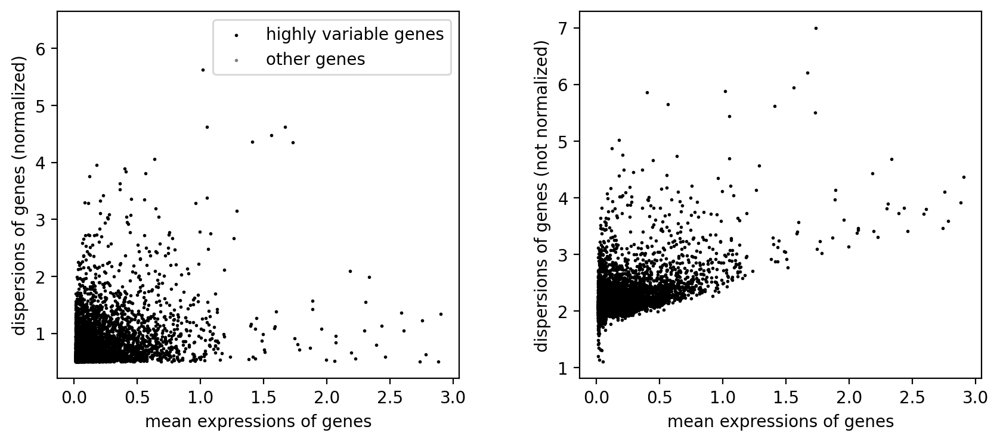

AnnData object with n_obs × n_vars = 813697 × 4173
    obs: 'soma_joinid', 'dataset_id', 'assay', 'assay_ontology_term_id', 'cell_type', 'cell_type_ontology_term_id', 'development_stage', 'development_stage_ontology_term_id', 'disease', 'disease_ontology_term_id', 'donor_id', 'is_primary_data', 'observation_joinid', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'sex', 'sex_ontology_term_id', 'suspension_type', 'tissue', 'tissue_ontology_term_id', 'tissue_type', 'tissue_general', 'tissue_general_ontology_term_id', 'raw_sum', 'nnz', 'raw_mean_nnz', 'raw_variance_nnz', 'n_measured_vars', 'basename', 'dataset_id_int', 'n_counts', 'n_genes', 'cell_type_annotation', 'level_1_annotation'
    var: 'n_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [12]:
adata.raw = adata  # keep full dimension safe
print(f"Number of genes before HVG selection: {adata.n_vars}")

rsc.pp.highly_variable_genes(
    adata, 
    batch_key="basename",
)

adata = adata[:, adata.var['highly_variable']].copy()

print(f"Number of genes after HVG selection: {adata.n_vars}")

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5, 4
sc.pl.highly_variable_genes(
    adata
)

adata

In [13]:
sc.logging.print_memory_usage()
print_memory_usage()

Memory usage: current 88.69 GB, difference +38.27 GB
[2025-04-14 14:50:31] Memory Report:
  • RAM used:     119.82 GB
  • GPU RAM used: 0.00 GB


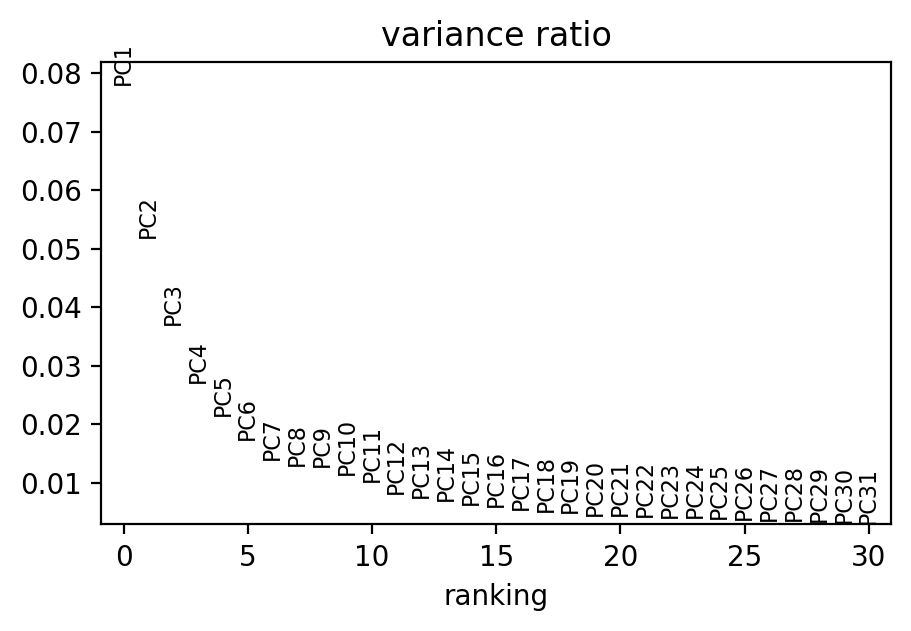

AnnData object with n_obs × n_vars = 813697 × 4173
    obs: 'soma_joinid', 'dataset_id', 'assay', 'assay_ontology_term_id', 'cell_type', 'cell_type_ontology_term_id', 'development_stage', 'development_stage_ontology_term_id', 'disease', 'disease_ontology_term_id', 'donor_id', 'is_primary_data', 'observation_joinid', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'sex', 'sex_ontology_term_id', 'suspension_type', 'tissue', 'tissue_ontology_term_id', 'tissue_type', 'tissue_general', 'tissue_general_ontology_term_id', 'raw_sum', 'nnz', 'raw_mean_nnz', 'raw_variance_nnz', 'n_measured_vars', 'basename', 'dataset_id_int', 'n_counts', 'n_genes', 'cell_type_annotation', 'level_1_annotation'
    var: 'n_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts'

In [14]:
rsc.pp.pca(
    adata,
)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5, 3
sc.pl.pca_variance_ratio(
    adata
)

adata

# Embedding

[2025-04-14 14:51:04.502] [CUML] [debug] n_neighbors=15
[2025-04-14 14:51:04.502] [CUML] [debug] Calling knn graph run
[2025-04-14 14:51:04.502] [CUML] [debug] Done. Calling fuzzy simplicial set
[2025-04-14 14:51:04.638] [CUML] [debug] Done. Calling remove zeros


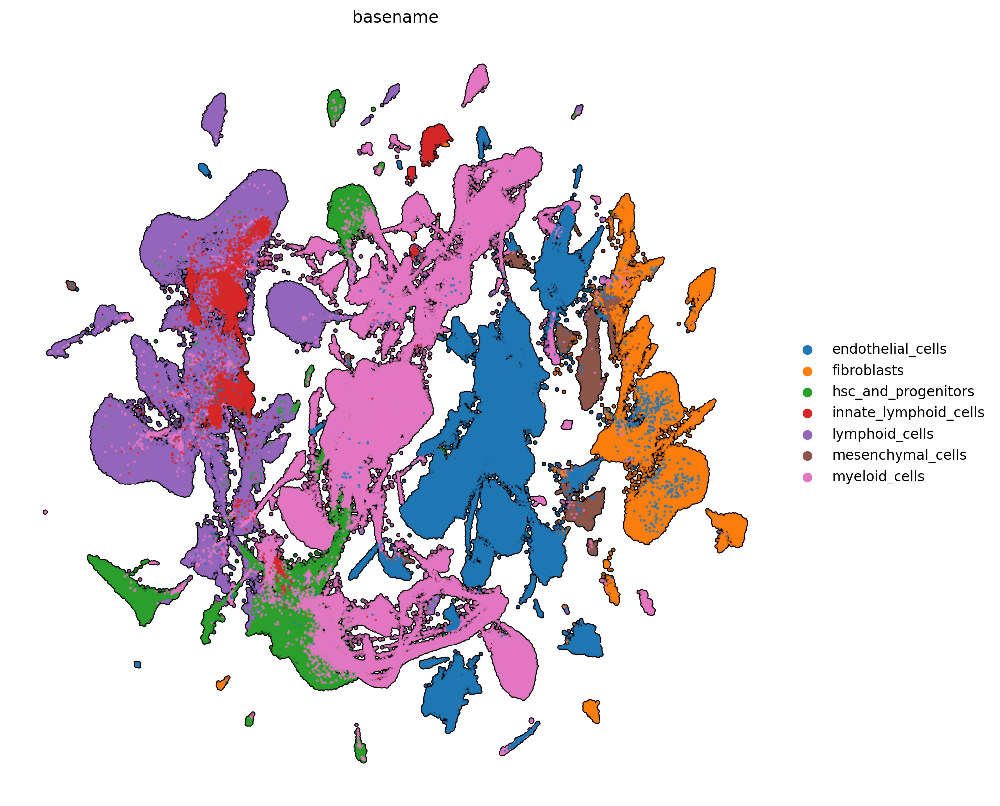

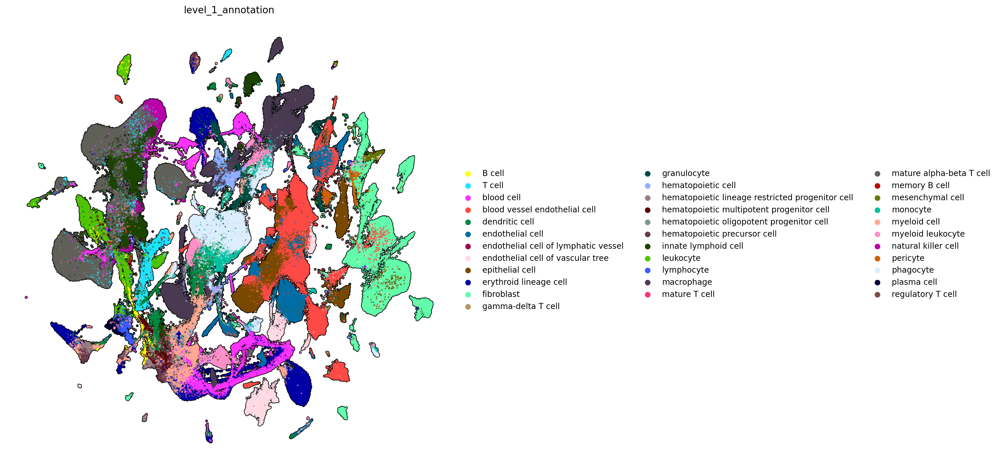

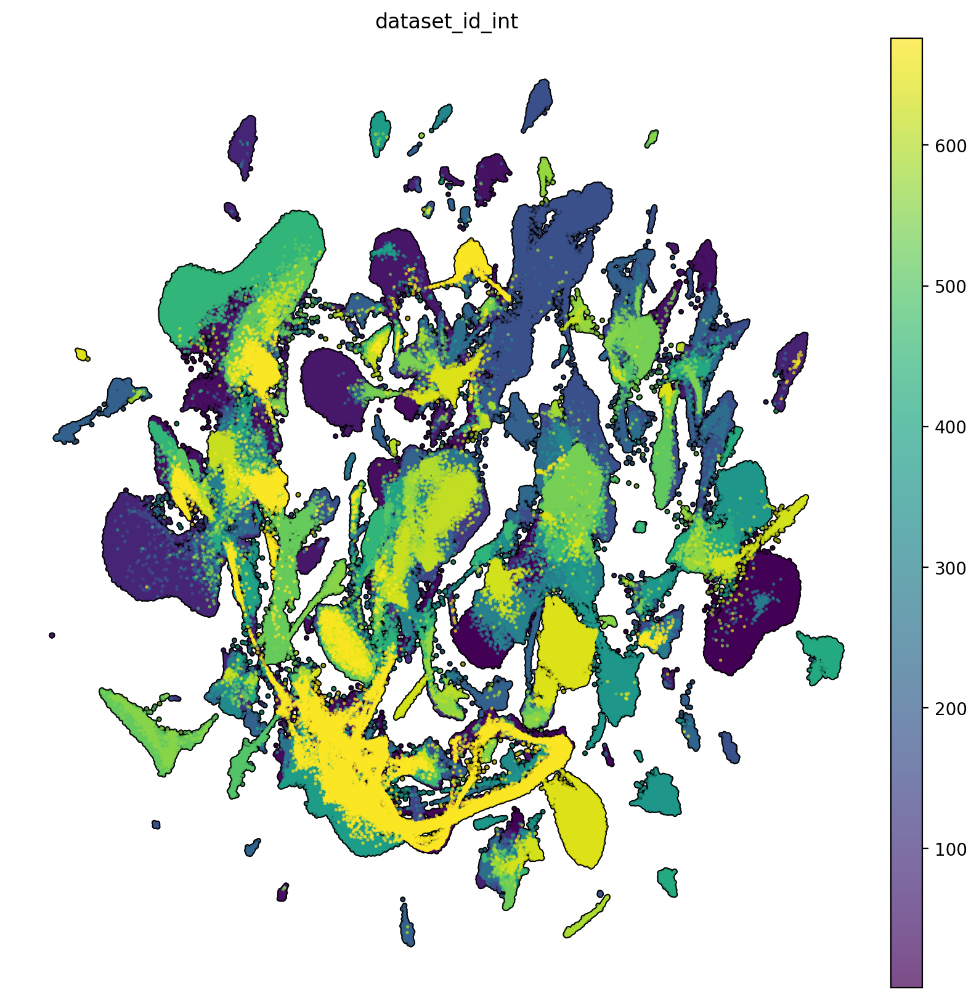

In [15]:
rsc.pp.neighbors(
    adata,
)

rsc.tl.umap(
    adata,
)

rsc.tl.leiden(
    adata,
    resolution=0.35,
)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 10, 10

for column in ['basename', 'level_1_annotation', 'dataset_id_int']:
    sc.pl.umap(
        adata,
        color=column,
        size=15,
        ncols=1,
        add_outline=True,
        outline_color=('k', 'k'),
        frameon=False,
    )


In [16]:
# break

SyntaxError: 'break' outside loop (668683560.py, line 1)

In [17]:
sc.logging.print_memory_usage()
print_memory_usage()

Memory usage: current 83.73 GB, difference -4.96 GB
[2025-04-14 14:52:15] Memory Report:
  • RAM used:     100.50 GB
  • GPU RAM used: 0.00 GB


# scVI

In [18]:
rsc.get.anndata_to_CPU(adata)

scvi.model.SCVI.setup_anndata(
    adata, 
    batch_key="dataset_id_int",
    labels_key='level_1_annotation',
)

model = scvi.model.SCVI(
    adata,
    n_layers=2,
    n_latent=24,
    gene_likelihood="nb",
)

model.train(
    max_epochs=100,
    accelerator="gpu",
    devices="auto",
    enable_model_summary=True,
    batch_size=1000,
    early_stopping=True,
    early_stopping_patience=5,
    early_stopping_monitor='validation_loss',
)

adata.obsm["X_scVI"] = model.get_latent_representation()

/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/scvi/data/fields/_dataframe_field.py:187: UserWarning: Category 109 in adata.obs['_scvi_batch'] has fewer than 3 cells. Models may not train properly.
  categorical_mapping = _make_column_categorical(
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/l ...
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using

Training:   0%|          | 0/100 [00:00<?, ?it/s]

Monitored metric validation_loss did not improve in the last 5 records. Best score: 621.875. Signaling Trainer to stop.


[2025-04-14 14:59:03.906] [CUML] [debug] n_neighbors=150
[2025-04-14 14:59:03.906] [CUML] [debug] Calling knn graph run
[2025-04-14 14:59:03.906] [CUML] [debug] Done. Calling fuzzy simplicial set
[2025-04-14 14:59:05.351] [CUML] [debug] Done. Calling remove zeros


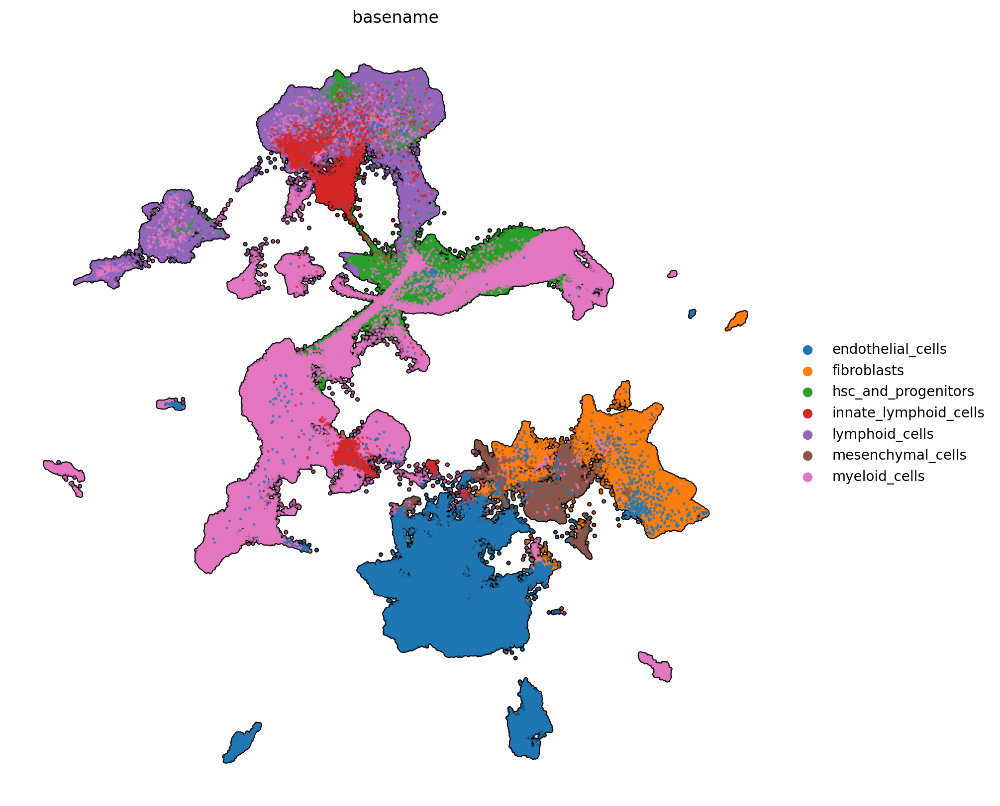

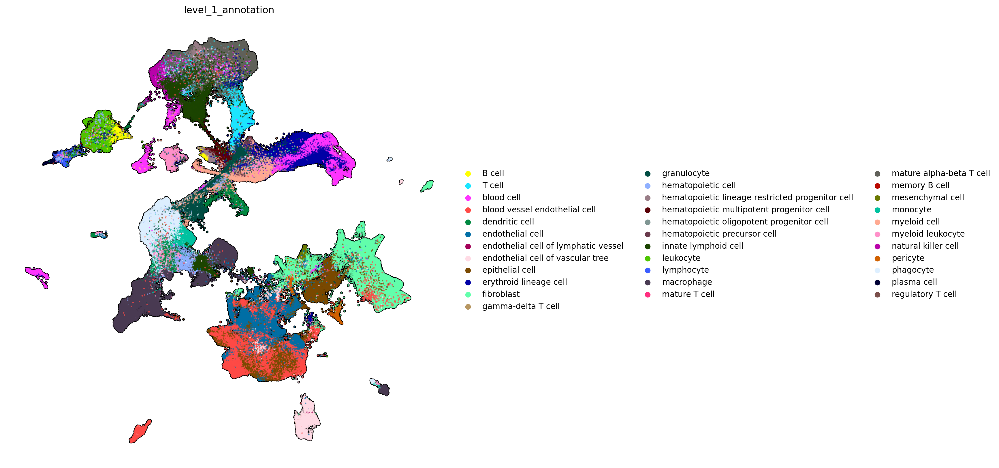

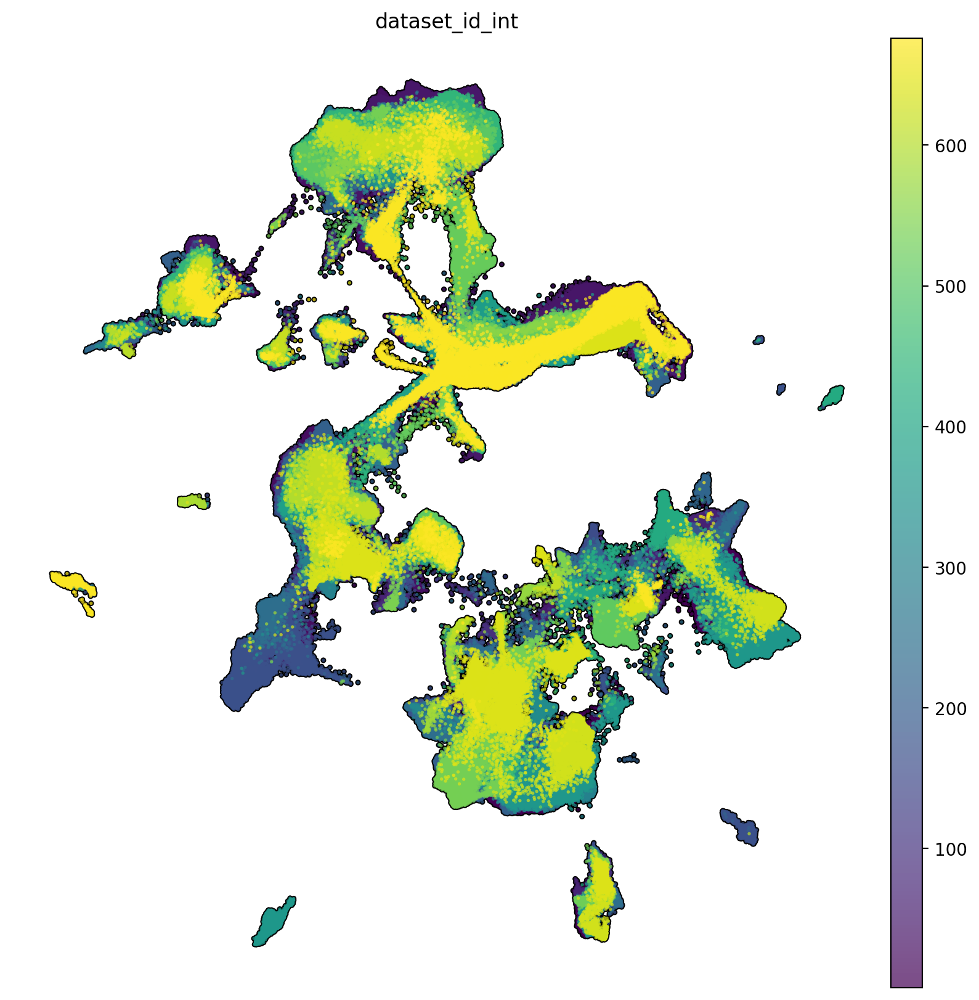

In [19]:
rsc.pp.neighbors(adata, use_rep="X_scVI", n_neighbors=150)
rsc.tl.leiden(adata)

rsc.tl.umap(adata)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 10, 10

for column in ['basename', 'level_1_annotation', 'dataset_id_int']:
    sc.pl.umap(
        adata,
        color=column,
        size=15,
        ncols=1,
        add_outline=True,
        outline_color=('k', 'k'),
        frameon=False,
    )



In [20]:
sc.logging.print_memory_usage()
print_memory_usage()

Memory usage: current 89.79 GB, difference +6.06 GB
[2025-04-14 15:01:50] Memory Report:
  • RAM used:     112.66 GB
  • GPU RAM used: 0.02 GB


# scANVI

In [21]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(
    model,
    adata=adata,
    labels_key="level_1_annotation",
    unlabeled_category="Unknown",
)

scanvi_model.train(
    max_epochs=20, 
    n_samples_per_label=100,
    accelerator="gpu",
    devices="auto",
    enable_model_summary=True,
    batch_size=1000,
    early_stopping=True,
    early_stopping_patience=5,
    early_stopping_monitor='validation_loss',
)

adata.obsm['X_scANVI'] = scanvi_model.get_latent_representation(adata)

/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/scvi/data/fields/_dataframe_field.py:187: UserWarning: Category 109 in adata.obs['_scvi_batch'] has fewer than 3 cells. Models may not train properly.
  categorical_mapping = _make_column_categorical(


INFO     Training for 20 epochs.                                                                                   


/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/l ...
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/l ...
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-7a0ac90f-2660-58ff-9bf4-b0aac48a4968]

  | Name            | Type                | Params | Mode 
-------

Training:   0%|          | 0/20 [00:00<?, ?it/s]

Monitored metric validation_loss did not improve in the last 5 records. Best score: 643.104. Signaling Trainer to stop.


[2025-04-14 15:38:11.035] [CUML] [debug] n_neighbors=150
[2025-04-14 15:38:11.035] [CUML] [debug] Calling knn graph run
[2025-04-14 15:38:11.035] [CUML] [debug] Done. Calling fuzzy simplicial set
[2025-04-14 15:38:12.460] [CUML] [debug] Done. Calling remove zeros


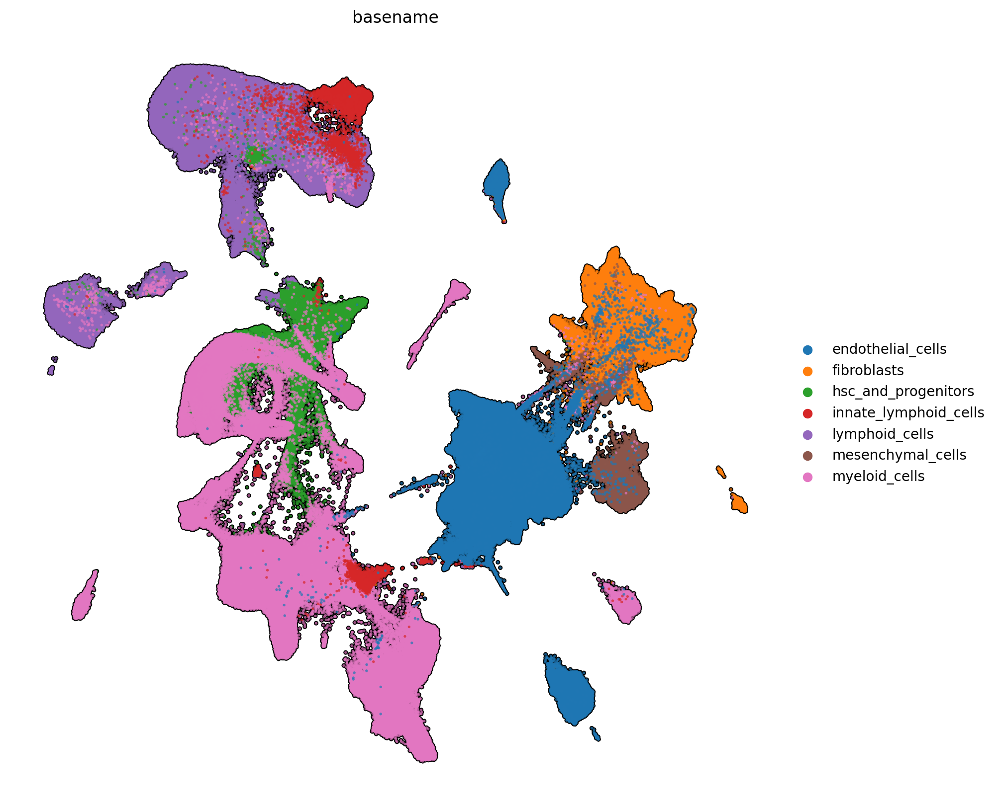

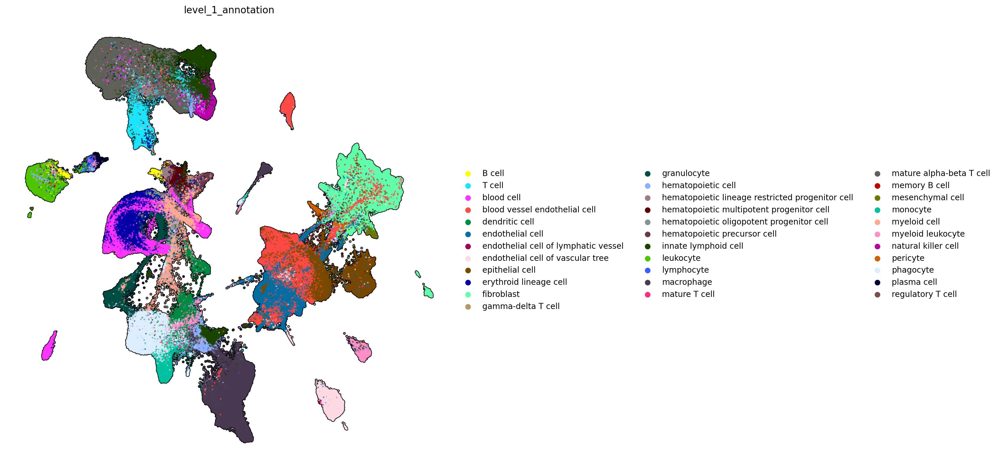

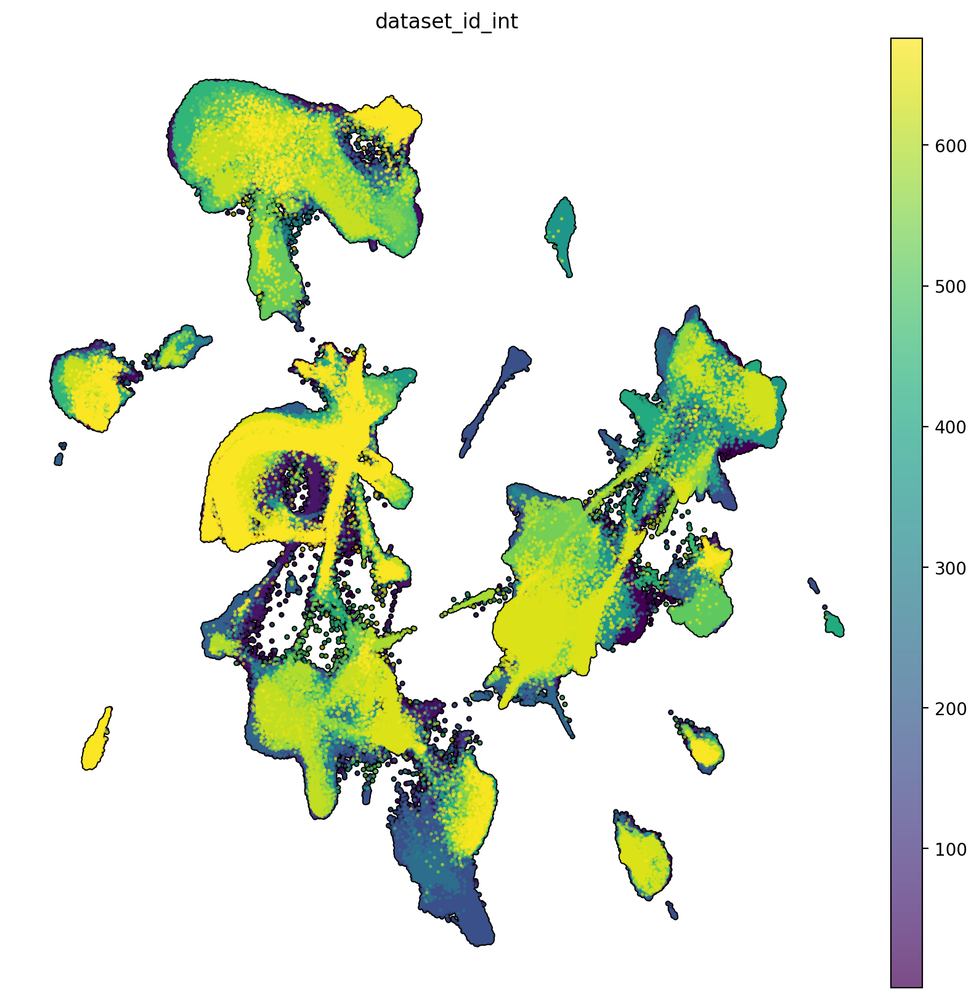

In [23]:
rsc.pp.neighbors(adata, use_rep='X_scANVI', n_neighbors=150)
rsc.tl.leiden(adata)

rsc.tl.umap(adata)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 10, 10

for column in ['basename', 'level_1_annotation', 'dataset_id_int']:
    sc.pl.umap(
        adata,
        color=column,
        size=15,
        ncols=1,
        add_outline=True,
        outline_color=('k', 'k'),
        frameon=False,
    )



In [ ]:
sc.logging.print_memory_usage()
print_memory_usage()

In [ ]:
adata.var.head()

In [ ]:

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 10, 10

sc.pl.umap(
    adata,
    color=['CD34', 'GATA2', 'GFI1B', 'FOS'],
    frameon=False,
    size=15,
    ncols=1,
    add_outline=True,
    outline_color=('k', 'k'),
)

# differential gene expression

In [ ]:
break

In [ ]:
# deg = scanvi_model.differential_expression(
#     adata,
#     groupby='cell_type_simplified',
#     batch_correction=True,
#     filter_outlier_cells=True,
# )

# deg = deg.reset_index()

In [ ]:
# rsc.tl.rank_genes_groups_logreg(
#     adata,
#     groupby='basename',
# )


# df = sc.get.rank_genes_groups_df(
#     adata,
#     group=None,
# )

# df.head()


In [ ]:
rsc.__version__